In [2]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import calendar
import folium
import geopandas as gpd
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

import math
import folium
import datetime
from os import listdir
from os.path import isfile, join

from matplotlib import gridspec
from matplotlib.backends.backend_pdf import PdfPages


## Analisi geografica

In [3]:
import matplotlib 
import matplotlib.pyplot as plt

font = {'size'   : 16}

matplotlib.rc('font', **font)

In [4]:
map = gpd.read_file('terremoto/Comuni2016/Com01012016_WGS84.shp',encoding='utf-8').to_crs('epsg:4326')
map = map[['COD_REG','COMUNE','geometry']]
map.columns = ['COD_REG','Comune','geometry']
map_reg = gpd.read_file('terremoto/Reg/Reg01012016_WGS84.shp').to_crs('epsg:4326')
map_reg = map_reg[map_reg['DEN_REG'].isin(['Marche','Lazio','Abruzzo','Umbria'])]
map_reg = map_reg[['COD_REG','DEN_REG','geometry']]
map_reg.columns = ['COD_REG','Regione','geometry']
map_reg.head()

,COD_REG,Regione,geometry
9,10,Umbria,"MULTIPOLYGON (((12.35804 43.61649, 12.35857 43..."
10,11,Marche,"POLYGON ((12.75621 43.96864, 12.75644 43.96851..."
11,12,Lazio,"MULTIPOLYGON (((12.24362 41.73787, 12.24419 41..."
12,13,Abruzzo,"MULTIPOLYGON (((14.23309 42.46541, 14.23313 42..."


In [5]:
map.head()

,COD_REG,Comune,geometry
0,1,Caluso,"POLYGON ((7.88298 45.31995, 7.88330 45.31957, ..."
1,1,Campiglione Fenile,"POLYGON ((7.33578 44.82104, 7.33678 44.82009, ..."
2,1,Azeglio,"MULTIPOLYGON (((7.96907 45.44259, 7.97009 45.4..."
3,1,Castagnole Piemonte,"POLYGON ((7.56751 44.91729, 7.56757 44.91721, ..."
4,1,Coassolo Torinese,"POLYGON ((7.44663 45.36538, 7.44749 45.36528, ..."


In [6]:
variaz = pd.read_csv('terremoto/variaz_phone.csv', sep=',')
mapx = map.merge(variaz).merge(map_reg[['COD_REG','Regione']])
crat = mapx[mapx['Cratere Centro Italia 2016'] == 1]
mapx.head()

,COD_REG,Comune,geometry,Cratere Centro Italia 2016,Variaz,Regione
0,11,Ripatransone,"POLYGON ((13.79857 43.03372, 13.79856 43.03366...",0,-2.061343,Marche
1,11,Trecastelli,"POLYGON ((13.11299 43.72705, 13.11340 43.72703...",0,-1.905821,Marche
2,11,Massa Fermana,"POLYGON ((13.47962 43.16622, 13.47990 43.16615...",1,-2.137485,Marche
3,11,Monsampietro Morico,"POLYGON ((13.56050 43.08014, 13.56080 43.07984...",1,-3.335143,Marche
4,11,Servigliano,"POLYGON ((13.51740 43.08507, 13.51762 43.08429...",1,-17.061260,Marche


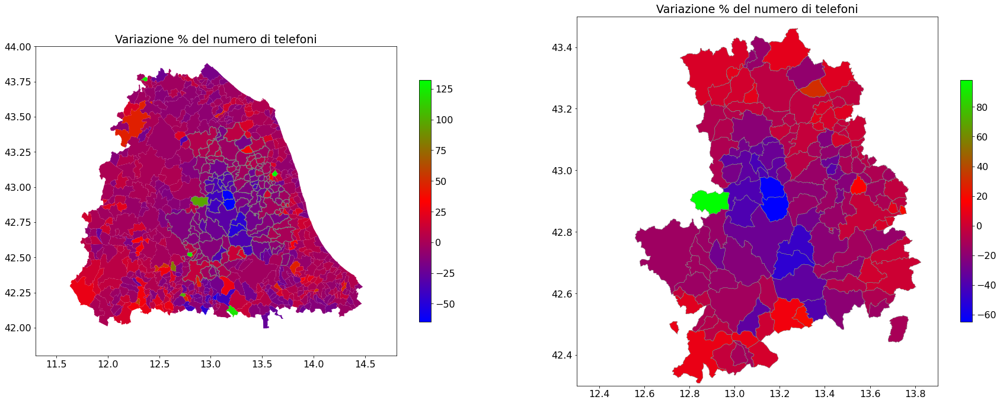

In [7]:
# https://matplotlib.org/2.0.2/users/colormaps.html
nrow=1
ncol=2
fig, axes = plt.subplots(nrow, ncol, figsize=(30,25))
ax3 = mapx.plot(column='Variaz', cmap = 'brg', legend= True, legend_kwds={'shrink': 0.3}, ax=axes[0])
crat.plot(ax=ax3, color='none', edgecolor='grey', linewidths=1)
ax3.set_ylim(41.8,44)
ax3.set_xlim(11.3,14.8)
ax3.title.set_text('Variazione % del numero di telefoni')

ax3 = crat.plot(column='Variaz', cmap = 'brg', legend= True, legend_kwds={'shrink': 0.3}, ax=axes[1])
crat.plot(ax=ax3, color='none', edgecolor='grey', linewidths=0.5)
ax3.set_ylim(42.3,43.5)
ax3.set_xlim(12.3,13.9)   
ax3.title.set_text('Variazione % del numero di telefoni')

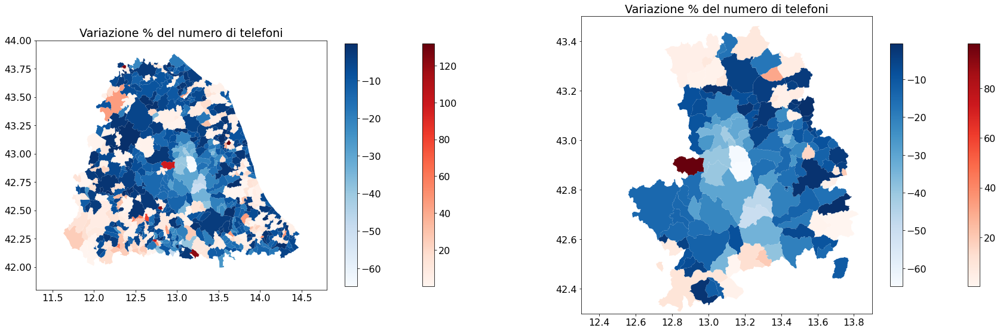

In [8]:
# https://matplotlib.org/2.0.2/users/colormaps.html
nrow=1
ncol=2
fig, axes = plt.subplots(nrow, ncol, figsize=(30,25))
ax3 = mapx[mapx['Variaz'] > 0].plot(column='Variaz', cmap = 'Reds', legend= True, legend_kwds={'shrink': 0.3}, ax=axes[0])
ax3 = mapx[mapx['Variaz'] <= 0].plot(column='Variaz', cmap = 'Blues', legend= True, legend_kwds={'shrink': 0.3}, ax=axes[0])
ax3.set_ylim(41.8,44)
ax3.set_xlim(11.3,14.8)
ax3.title.set_text('Variazione % del numero di telefoni')

ax3 = crat[crat['Variaz'] > 0].plot(column='Variaz', cmap = 'Reds', legend= True, legend_kwds={'shrink': 0.3}, ax=axes[1])
ax3 = crat[crat['Variaz'] <= 0].plot(column='Variaz', cmap = 'Blues', legend= True, legend_kwds={'shrink': 0.3}, ax=axes[1])
ax3.set_ylim(42.3,43.5)
ax3.set_xlim(12.3,13.9)   
ax3.title.set_text('Variazione % del numero di telefoni')

In [9]:
mapx

,COD_REG,Comune,geometry,Cratere Centro Italia 2016,Variaz,Regione
0,11,Ripatransone,"POLYGON ((13.79857 43.03372, 13.79856 43.03366...",0,-2.061343,Marche
1,11,Trecastelli,"POLYGON ((13.11299 43.72705, 13.11340 43.72703...",0,-1.905821,Marche
2,11,Massa Fermana,"POLYGON ((13.47962 43.16622, 13.47990 43.16615...",1,-2.137485,Marche
3,11,Monsampietro Morico,"POLYGON ((13.56050 43.08014, 13.56080 43.07984...",1,-3.335143,Marche
4,11,Servigliano,"POLYGON ((13.51740 43.08507, 13.51762 43.08429...",1,-17.061260,Marche
...,...,...,...,...,...,...
626,12,Vejano,"MULTIPOLYGON (((12.12282 42.21883, 12.12282 42...",0,-7.742130,Lazio
627,12,Forano,"POLYGON ((12.58725 42.31066, 12.58838 42.31037...",0,-11.547641,Lazio
628,12,Frasso Sabino,"POLYGON ((12.81024 42.23353, 12.81090 42.23322...",0,-28.543411,Lazio
629,12,Greccio,"POLYGON ((12.74704 42.46776, 12.74732 42.46768...",0,-6.076854,Lazio


# Analisi Geografica Folium

In [10]:
mapx = mapx.set_crs(epsg=4326)
mapx['geometry'] = mapx['geometry'].simplify(0.001, preserve_topology=False)
mapx['Variaz'] = mapx['Variaz'].round(0)

def style_function(x):
    color = '#000000'
    fill = '#ffffff'
    return {'fillColor': fill, 
            'color':color, 
            'fillOpacity': 0.1, 
            'weight': 0.5}

def highlight_function(x):
    color = '#000000'
    fill =  '#000000'
    return {'fillColor': fill, 
            'color':color, 
            'fillOpacity': 0.50, 
            'weight': 0.1}



other = folium.features.GeoJson(
    mapx,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Regione','Comune','Cratere Centro Italia 2016','Variaz'],
        aliases=['Regione','Comune','Cratere Centro Italia 2016','Variaz %'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)


myscale = [min(mapx['Variaz']),-30,-20,0,20,30,max(mapx['Variaz'])]

m = folium.Map(location=[mapx.centroid.y.mean(), mapx.centroid.x.mean()], tiles="cartodbpositron", zoom_start=8)
folium.Choropleth(
 geo_data=mapx,
 name='Choropleth',
 data=mapx,
 columns=['Comune','Variaz'],
 key_on="feature.properties.Comune",
 fill_color='RdBu',
 threshold_scale=myscale,
 fill_opacity=1,
 line_opacity=0.2,
 legend_name='YOY %',
 #smooth_factor=0
).add_to(m)


for _, r in map_reg.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry'])#.simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,style_function=lambda x: {'fillColor': '#ffffff','color': '#000000'})
    geo_j.add_to(m)

crat_border = gpd.GeoDataFrame(geometry=[crat.geometry.unary_union], crs=crat.crs)
sim_geo = gpd.GeoSeries(crat_border['geometry']).simplify(tolerance=0.001)
geo_j = sim_geo.to_json()
geo_j = folium.GeoJson(data=geo_j,style_function=lambda x: {'fillColor': '#ffffff','color': '#ff0000'})
geo_j.add_to(m)

m.add_child(other)
m.keep_in_front(other)
folium.LayerControl().add_to(m)

m

C:\Users\Marco\AppData\Local\Temp/ipykernel_9340/2856674958.py:38: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[mapx.centroid.y.mean(), mapx.centroid.x.mean()], tiles="cartodbpositron", zoom_start=8)
C:\Users\Marco\AppData\Local\Temp/ipykernel_9340/2856674958.py:38: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[mapx.centroid.y.mean(), mapx.centroid.x.mean()], tiles="cartodbpositron", zoom_start=8)


# ANALISI ATECO

In [11]:
ateco2007 = pd.read_csv('terremoto/Ateco2007.csv', sep=';')
ateco1 = ateco2007[ateco2007['Codice Ateco 2007'].str.len()==1].reset_index().drop(['index','Codice Ateco 2007'],axis=1)
ateco1.columns = ['ateco1','desc1']
ateco2 = ateco2007[ateco2007['Codice Ateco 2007'].str.len()==2].reset_index().drop('index',axis=1)
ateco2.columns = ['ateco1','ateco2','desc2']
ateco = pd.merge(ateco1,ateco2)
ateco

,ateco1,desc1,ateco2,desc2
0,A,"AGRICOLTURA, SILVICOLTURA E PESCA",01,COLTIVAZIONI AGRICOLE E PRODUZIONE DI PRODOTTI...
1,A,"AGRICOLTURA, SILVICOLTURA E PESCA",02,SILVICOLTURA ED UTILIZZO DI AREE FORESTALI
2,A,"AGRICOLTURA, SILVICOLTURA E PESCA",03,PESCA E ACQUACOLTURA
3,B,ESTRAZIONE DI MINERALI DA CAVE E MINIERE,05,ESTRAZIONE DI CARBONE (ESCLUSA TORBA)
4,B,ESTRAZIONE DI MINERALI DA CAVE E MINIERE,06,ESTRAZIONE DI PETROLIO GREGGIO E DI GAS NATURALE
...,...,...,...,...
83,S,ALTRE ATTIVITÀ DI SERVIZI,95,RIPARAZIONE DI COMPUTER E DI BENI PER USO PERS...
84,S,ALTRE ATTIVITÀ DI SERVIZI,96,ALTRE ATTIVITÀ DI SERVIZI PER LA PERSONA
85,T,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,97,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...
86,T,ATTIVITÀ DI FAMIGLIE E CONVIVENZE COME DATORI ...,98,PRODUZIONE DI BENI E SERVIZI INDIFFERENZIATI P...


In [12]:
aida = pd.read_csv('terremoto/aida_crateri2.csv')
aida = aida[aida['ATECO 2007 codice'].notna()]
aida['ATECO 2007 codice'] = aida['ATECO 2007 codice'].astype(int).astype('string')
m = aida['ATECO 2007 codice'].str.len().max()
aida['ATECO 2007 codice'] = aida['ATECO 2007 codice'].str.rjust(m, '0')
aida['ateco2'] = aida['ATECO 2007 codice'].astype('str').str[0:2]
aida = aida[['Comune','Ricavi delle vendite migl EUR Ultimo anno disp.','Dipendenti Ultimo anno disp.','Stato giuridico','ateco2']]
aida.columns = ['Comune','ricavi','dipendenti','stato','ateco2']
aida['survive'] = np.where(aida['stato']=='Attiva', 1, 0)
aida.head(10)

C:\Users\Marco\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (15) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Comune,ricavi,dipendenti,stato,ateco2,survive
0,Cerreto d'Esi,73297.0,292,Attiva,28,1
1,Cerreto d'Esi,21872.0,179,Cessata (Fusione),27,0
2,Cerreto d'Esi,21804.0,158,Fallita,31,0
3,Cerreto d'Esi,16484.0,25,Cessata (Fusione),46,0
4,Cerreto d'Esi,14400.0,86,Fallita,17,0
5,Cerreto d'Esi,13232.0,8,Cessata (Fusione),27,0
6,Cerreto d'Esi,8861.0,39,Attiva,31,1
7,Cerreto d'Esi,5636.0,6,Attiva,24,1
8,Cerreto d'Esi,5529.0,11,Attiva,20,1
9,Cerreto d'Esi,4099.0,2,Fallita,49,0


In [13]:
aida_ateco = pd.merge(aida.astype('str') , ateco.astype('str') , how='left', on='ateco2')
aida_ateco.loc[aida_ateco['ricavi'] == 'n.d.','ricavi'] = np.nan
aida_ateco.loc[aida_ateco['dipendenti'] == 'n.d.','dipendenti'] = np.nan
aida_ateco['survive'] = aida_ateco['survive'].astype('int')
aida_ateco['ricavi'] = aida_ateco['ricavi'].astype('float')
aida_ateco['dipendenti'] = aida_ateco['dipendenti'].astype('float')
aida_ateco.head()

,Comune,ricavi,dipendenti,stato,ateco2,survive,ateco1,desc1,desc2
0,Cerreto d'Esi,73297.0,292.0,Attiva,28,1,C,ATTIVITÀ MANIFATTURIERE,FABBRICAZIONE DI MACCHINARI ED APPARECCHIATURE...
1,Cerreto d'Esi,21872.0,179.0,Cessata (Fusione),27,0,C,ATTIVITÀ MANIFATTURIERE,FABBRICAZIONE DI APPARECCHIATURE ELETTRICHE ED...
2,Cerreto d'Esi,21804.0,158.0,Fallita,31,0,C,ATTIVITÀ MANIFATTURIERE,FABBRICAZIONE DI MOBILI
3,Cerreto d'Esi,16484.0,25.0,Cessata (Fusione),46,0,G,COMMERCIO ALL'INGROSSO E AL DETTAGLIO; RIPARAZ...,COMMERCIO ALL'INGROSSO (ESCLUSO QUELLO DI AUTO...
4,Cerreto d'Esi,14400.0,86.0,Fallita,17,0,C,ATTIVITÀ MANIFATTURIERE,FABBRICAZIONE DI CARTA E DI PRODOTTI DI CARTA


In [14]:
aggregation = {'survive':[np.size,np.sum,np.mean],'ricavi':[np.sum],'dipendenti':[np.sum]}
c_name1 = ['Comune','ateco1','desc1','n_imprese','n_imprese_attive','perc_suvive','tot_ricavi','tot_dipendenti']
c_name2 = ['Comune','ateco2','desc2','n_imprese','n_imprese_attive','perc_suvive','tot_ricavi','tot_dipendenti']

imprese_ateco1 = aida_ateco.groupby(['Comune', 'ateco1','desc1']).aggregate(aggregation).reset_index()
imprese_ateco1.columns = c_name1
imprese_ateco1.head()

,Comune,ateco1,desc1,n_imprese,n_imprese_attive,perc_suvive,tot_ricavi,tot_dipendenti
0,Abbateggio,F,COSTRUZIONI,1,1,1.0,154.0,7.0
1,Abbateggio,G,COMMERCIO ALL'INGROSSO E AL DETTAGLIO; RIPARAZ...,1,0,0.0,0.0,0.0
2,Abbateggio,H,TRASPORTO E MAGAZZINAGGIO,1,1,1.0,768.0,1.0
3,Abbateggio,I,ATTIVITÀ DEI SERVIZI DI ALLOGGIO E DI RISTORAZ...,1,1,1.0,51.0,2.0
4,Abbateggio,M,"ATTIVITÀ PROFESSIONALI, SCIENTIFICHE E TECNICHE",1,1,1.0,0.0,0.0


In [15]:
imprese_ateco2 = aida_ateco.groupby(['Comune','ateco2','desc2']).aggregate(aggregation).reset_index()
imprese_ateco2.columns = c_name2
imprese_ateco2.head()

,Comune,ateco2,desc2,n_imprese,n_imprese_attive,perc_suvive,tot_ricavi,tot_dipendenti
0,Abbateggio,41,COSTRUZIONE DI EDIFICI,1,1,1.0,154.0,7.0
1,Abbateggio,46,COMMERCIO ALL'INGROSSO (ESCLUSO QUELLO DI AUTO...,1,0,0.0,0.0,0.0
2,Abbateggio,49,TRASPORTO TERRESTRE E TRASPORTO MEDIANTE CONDOTTE,1,1,1.0,768.0,1.0
3,Abbateggio,56,ATTIVITÀ DEI SERVIZI DI RISTORAZIONE,1,1,1.0,51.0,2.0
4,Abbateggio,73,PUBBLICITÀ E RICERCHE DI MERCATO,1,1,1.0,0.0,0.0


In [18]:
value = 'tot_dipendenti'#'tot_ricavi' #'n_imprese'
long = imprese_ateco1
wide = long.pivot_table(index=['Comune'],columns='desc1',values=value).reset_index()
wide.columns.name = ''
#wide[wide.isna()] = 0
wide = wide.where(wide.notna(), other=0)
wide['sum'] = wide.iloc[:,1:].sum(axis=1)
for x in wide.columns[1:-1]:
    wide[x] = wide[x] / wide['sum']
wide

,Comune,"AGRICOLTURA, SILVICOLTURA E PESCA",ALTRE ATTIVITÀ DI SERVIZI,AMMINISTRAZIONE PUBBLICA E DIFESA; ASSICURAZIONE SOCIALE OBBLIGATORIA,ATTIVITA' IMMOBILIARI,"ATTIVITÀ ARTISTICHE, SPORTIVE, DI INTRATTENIMENTO E DIVERTIMENTO",ATTIVITÀ DEI SERVIZI DI ALLOGGIO E DI RISTORAZIONE,ATTIVITÀ FINANZIARIE E ASSICURATIVE,ATTIVITÀ MANIFATTURIERE,"ATTIVITÀ PROFESSIONALI, SCIENTIFICHE E TECNICHE",...,ESTRAZIONE DI MINERALI DA CAVE E MINIERE,"FORNITURA DI ACQUA; RETI FOGNARIE, ATTIVITÀ DI GESTIONE DEI RIFIUTI E RISANAMENTO","FORNITURA DI ENERGIA ELETTRICA, GAS, VAPORE E ARIA CONDIZIONATA",ISTRUZIONE,"NOLEGGIO, AGENZIE DI VIAGGIO, SERVIZI DI SUPPORTO ALLE IMPRESE",ORGANIZZAZIONI ED ORGANISMI EXTRATERRITORIALI,SANITA' E ASSISTENZA SOCIALE,SERVIZI DI INFORMAZIONE E COMUNICAZIONE,TRASPORTO E MAGAZZINAGGIO,sum
0,Abbateggio,0.000000,0.0,0.0,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,10.0
1,Acciano,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,5.0
2,Accumoli,0.433333,0.0,0.0,0.000000,0.000000,0.300000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,30.0
3,Acqualagna,0.029106,0.0,0.0,0.006237,0.000000,0.068607,0.000000,0.332640,0.014553,...,0.014553,0.002079,0.000000,0.000000,0.108108,0.000000,0.272349,0.000000,0.006237,481.0
4,Acquapendente,0.000000,0.0,0.0,0.000000,0.017442,0.087209,0.000000,0.514535,0.017442,...,0.000000,0.011628,0.000000,0.000000,0.055233,0.000000,0.043605,0.020349,0.000000,344.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
593,Villa Santa Lucia degli Abruzzi,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
594,Villamagna,0.055556,0.0,0.0,0.002315,0.000000,0.071759,0.000000,0.379630,0.004630,...,0.000000,0.000000,0.000000,0.000000,0.287037,0.000000,0.002315,0.004630,0.030093,432.0
595,Visso,0.000000,0.0,0.0,0.000000,0.000000,0.040724,0.000000,0.619910,0.018100,...,0.000000,0.000000,0.000000,0.000000,0.004525,0.000000,0.000000,0.000000,0.000000,221.0
596,Viterbo,0.024896,0.0,0.0,0.014819,0.002371,0.132949,0.044966,0.076467,0.028453,...,0.001101,0.035651,0.000169,0.012279,0.141756,0.000339,0.056059,0.024558,0.044627,11809.0


In [16]:
comuni = []
desc = []
for i,row in wide.iterrows():
    comuni.append(row['Comune'])
    d = ''
    row = row.iloc[1:-1]
    sorted_row = sorted(row.items(),key=lambda kv: kv[1], reverse=True)
    for k,v in sorted_row:
        if k != 'Comune' and k != 'sum' and v > 0.1:
            k = k[0:min(len(k),20)]
            d += k+'='+str(round(v*100))+'%<br>'
    desc.append(d)

ateco_desc = pd.DataFrame({'Comune':comuni,'Ateco_desc':desc})
ateco_desc.head()
    

,Comune,Ateco_desc
0,Abbateggio,COSTRUZIONI=70%<br>ATTIVITÀ DEI SERVIZI=20%<br>
1,Acciano,COMMERCIO ALL'INGROS=40%<br>COSTRUZIONI=40%<br...
2,Accumoli,"AGRICOLTURA, SILVICO=43%<br>ATTIVITÀ DEI SERVI..."
3,Acqualagna,ATTIVITÀ MANIFATTURI=33%<br>SANITA' E ASSISTEN...
4,Acquapendente,ATTIVITÀ MANIFATTURI=51%<br>COMMERCIO ALL'INGR...


In [17]:
mapx = map.merge(variaz).merge(map_reg[['COD_REG','Regione']])
mapx = mapx.set_crs(epsg=4326)
mapx['geometry'] = mapx['geometry'].simplify(0.001, preserve_topology=False)
mapx['Variaz'] = mapx['Variaz'].round(0)
mapx = mapx.merge(ateco_desc,how='left')

def style_function(x):
    color = '#000000'
    fill = '#ffffff'
    return {'fillColor': fill, 
            'color':color, 
            'fillOpacity': 0.1, 
            'weight': 0.5}

def highlight_function(x):
    color = '#000000'
    fill =  '#000000'
    return {'fillColor': fill, 
            'color':color, 
            'fillOpacity': 0.50, 
            'weight': 0.1}



other = folium.features.GeoJson(
    mapx,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Regione','Comune','Cratere Centro Italia 2016','Ateco_desc','Variaz'],
        aliases=['Regione','Comune','Cratere Centro Italia 2016','Ateco','Variaz %'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)


myscale = [min(mapx['Variaz']),-30,-20,-10,10,20,30,max(mapx['Variaz'])]

m = folium.Map(location=[mapx.centroid.y.mean(), mapx.centroid.x.mean()], tiles="cartodbpositron", zoom_start=8)
folium.Choropleth(
 geo_data=mapx,
 name='Choropleth',
 data=mapx,
 columns=['Comune','Variaz'],
 key_on="feature.properties.Comune",
 fill_color='RdBu',
 threshold_scale=myscale,
 fill_opacity=1,
 line_opacity=0.2,
 legend_name='YOY %',
 #smooth_factor=0
).add_to(m)


for _, r in map_reg.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry'])#.simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,style_function=lambda x: {'fillColor': '#ffffff','color': '#000000'})
    geo_j.add_to(m)

crat_border = gpd.GeoDataFrame(geometry=[crat.geometry.unary_union], crs=crat.crs)
sim_geo = gpd.GeoSeries(crat_border['geometry']).simplify(tolerance=0.001)
geo_j = sim_geo.to_json()
geo_j = folium.GeoJson(data=geo_j,style_function=lambda x: {'fillColor': '#ffffff','color': '#ff0000'})
geo_j.add_to(m)

m.add_child(other)
m.keep_in_front(other)
folium.LayerControl().add_to(m)

m

C:\Users\Marco\AppData\Local\Temp/ipykernel_15364/2397204476.py:40: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[mapx.centroid.y.mean(), mapx.centroid.x.mean()], tiles="cartodbpositron", zoom_start=8)
C:\Users\Marco\AppData\Local\Temp/ipykernel_15364/2397204476.py:40: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[mapx.centroid.y.mean(), mapx.centroid.x.mean()], tiles="cartodbpositron", zoom_start=8)
